# **Graphing a company facebook network.**

Data obtained from:  https://github.com/benedekrozemberczki/GEMSEC/tree/master/data

Code example from https://networkx.org/nx-guides/content/exploratory_notebooks/facebook_notebook.html using the above data

In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib
import matplotlib.pyplot as plt
from random import randint

#import the data
csv_url = 'https://raw.githubusercontent.com/benedekrozemberczki/GEMSEC/master/data/company_edges.csv'
company = pd.read_csv(csv_url, on_bad_lines='error')

#from google.colab import files
  
#uploaded = files.upload()



In [ ]:
#view the data

print(company.iloc[:9])
G = nx.from_pandas_edgelist(company, "node_1", "node_2")

   node_1  node_2
0       0    2243
1       0   12084
2       0    6169
3       0    4887
4       0    3694
5       0    6260
6       0    6977
7       0    8788
8       0    2399


In [ ]:
company.dtypes

node_1    int64
node_2    int64
dtype: object

In [ ]:
#check for null

company.isnull().values.any()

False

In [ ]:
#check for self loops
nx.number_of_selfloops(G)

184

In [ ]:
#Find the self loop edges
loop_edges=list(nx.selfloop_edges(G, keys=True))

In [ ]:
#Remove the self loop edges
G.remove_edges_from(loop_edges)

In [ ]:
#check that the self loops are removed
nx.number_of_selfloops(G)

0

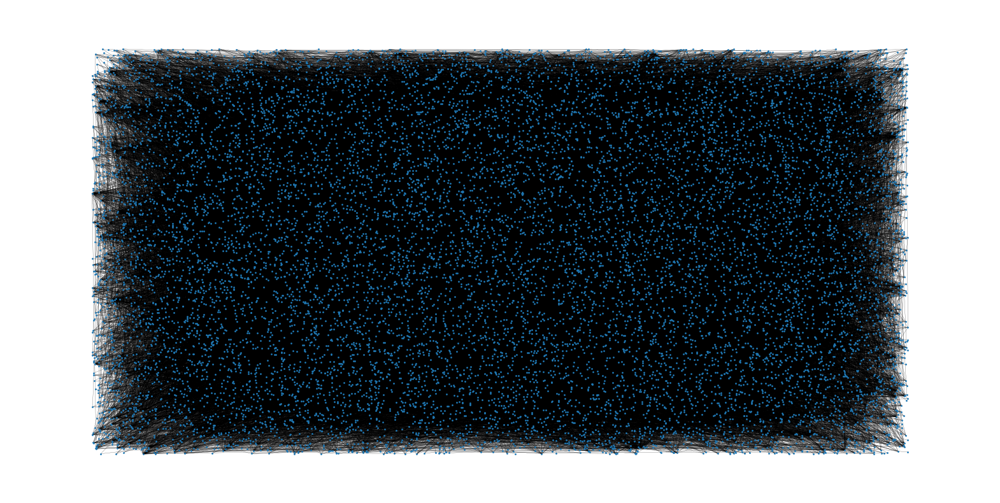

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))
ax.axis("off")
plot_options = {"node_size": 1, "with_labels": False, "width": 0.15}
nx.draw_networkx(G, pos=nx.random_layout(G), ax=ax, **plot_options)

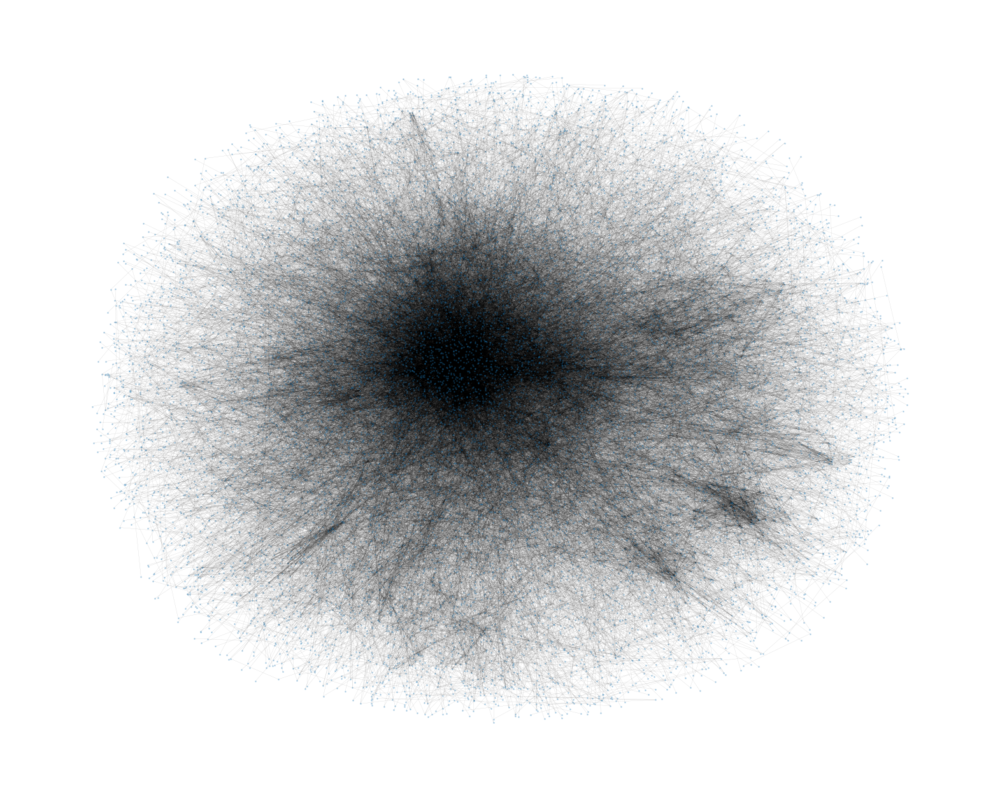

In [ ]:
pos = nx.spring_layout(G,  k = 0.1)
fig, ax = plt.subplots(figsize=(20, 16))
ax.axis("off")
nx.draw_networkx(G, pos=pos, ax=ax, alpha = 0.25, **plot_options)

In [ ]:
# number of nodes
G.number_of_nodes()

14113

In [ ]:
# number of edges
G.number_of_edges()

52126

In [ ]:
#average degree of a node
np.mean([d for _, d in G.degree()])
# in this case one node is connected on average to 14 other nodes

7.386948203783746

In [ ]:
shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(G))

In [ ]:
#How many nodes to traverse from one node to another (maximum)
diameter = max(nx.eccentricity(G, sp=shortest_path_lengths).values())
diameter

15

In [ ]:
# Compute the average shortest path length for each node:  average shortest path between two nodes
average_path_lengths = [np.mean(list(spl.values())) for spl in shortest_path_lengths.values()]
# The average over all nodes
np.mean(average_path_lengths)

5.3098218899213085

Text(0, 0.5, 'Frequency (%)')

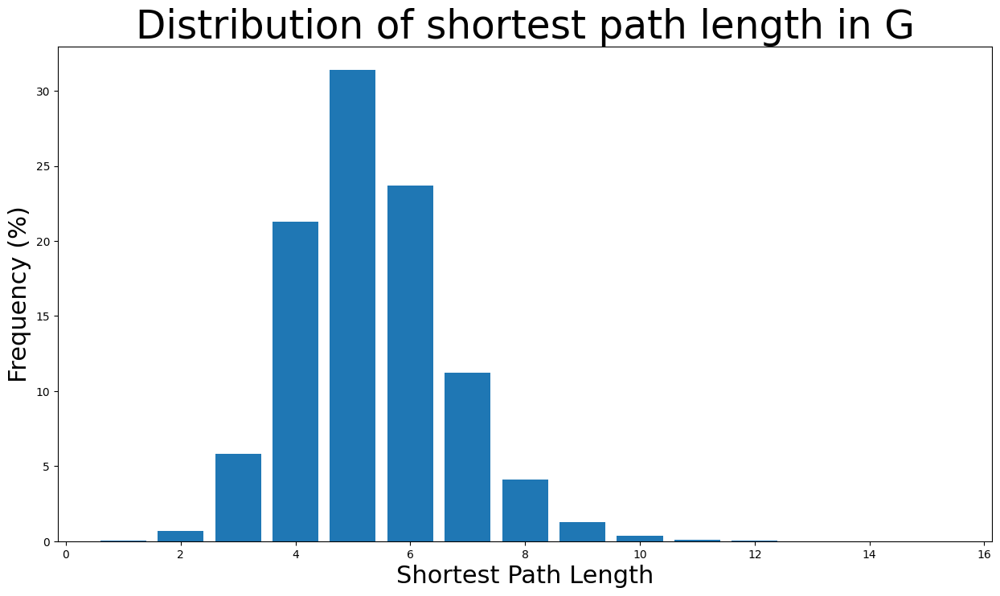

In [ ]:
# We know the maximum shortest path length (the diameter), so create an array
# to store values from 0 up to (and including) diameter
path_lengths = np.zeros(diameter + 1, dtype=int)

# Extract the frequency of shortest path lengths between two nodes
for pls in shortest_path_lengths.values():
    pl, cnts = np.unique(list(pls.values()), return_counts=True)
    path_lengths[pl] += cnts

# Express frequency distribution as a percentage (ignoring path lengths of 0)
freq_percent = 100 * path_lengths[1:] / path_lengths[1:].sum()

# Plot the frequency distribution (ignoring path lengths of 0) as a percentage
fig, ax = plt.subplots(figsize=(15, 8))
ax.bar(np.arange(1, diameter + 1), height=freq_percent)
ax.set_title(
    "Distribution of shortest path length in G", fontdict={"size": 35}, loc="center"
)
ax.set_xlabel("Shortest Path Length", fontdict={"size": 22})
ax.set_ylabel("Frequency (%)", fontdict={"size": 22})

In [ ]:
#density of less than one indicates sparse graph.  Expected in real world/small world graphs
nx.density(G) 
#much less dense than politicians


0.000523451545052703

In [ ]:
#How many components to the graph
nx.number_connected_components(G)

1

In [ ]:
#find the 8 nodes with the greatest centrality
degree_centrality = nx.centrality.degree_centrality(
    G
)  # save results in a variable to use again
(sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True))[:10]

[(8396, 0.015235260770975057),
 (11934, 0.015022675736961451),
 (856, 0.01403061224489796),
 (11380, 0.013747165532879819),
 (9886, 0.013109410430839002),
 (8223, 0.012684240362811792),
 (1237, 0.01211734693877551),
 (8924, 0.011337868480725623),
 (1854, 0.010416666666666666),
 (11095, 0.010274943310657597)]

In [ ]:
# Number of neighbors for these 8 highest centrality nodes
(sorted(G.degree, key=lambda item: item[1], reverse=True))[:10]

[(8396, 215),
 (11934, 212),
 (856, 198),
 (11380, 194),
 (9886, 185),
 (8223, 179),
 (1237, 171),
 (8924, 160),
 (1854, 147),
 (11095, 145)]

Text(0, 0.5, 'Counts')

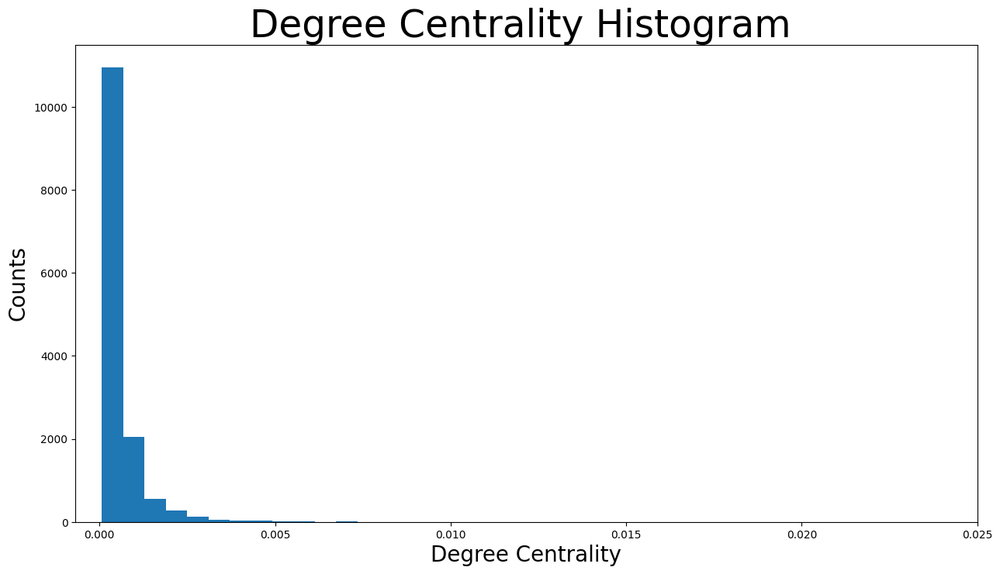

In [ ]:
#Plot degree centrality of all nodes
plt.figure(figsize=(15, 8))
plt.hist(degree_centrality.values(), bins=25)
plt.xticks(ticks=[0,0.005,0.010,0.015, 0.020, 0.025])  # set the x axis ticks
plt.title("Degree Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Degree Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})
#degree centralities of companies are more similar to each other than 

(-1.2077238819003107,
 1.1860465666651727,
 -1.1915516394376755,
 1.1959571379423142)

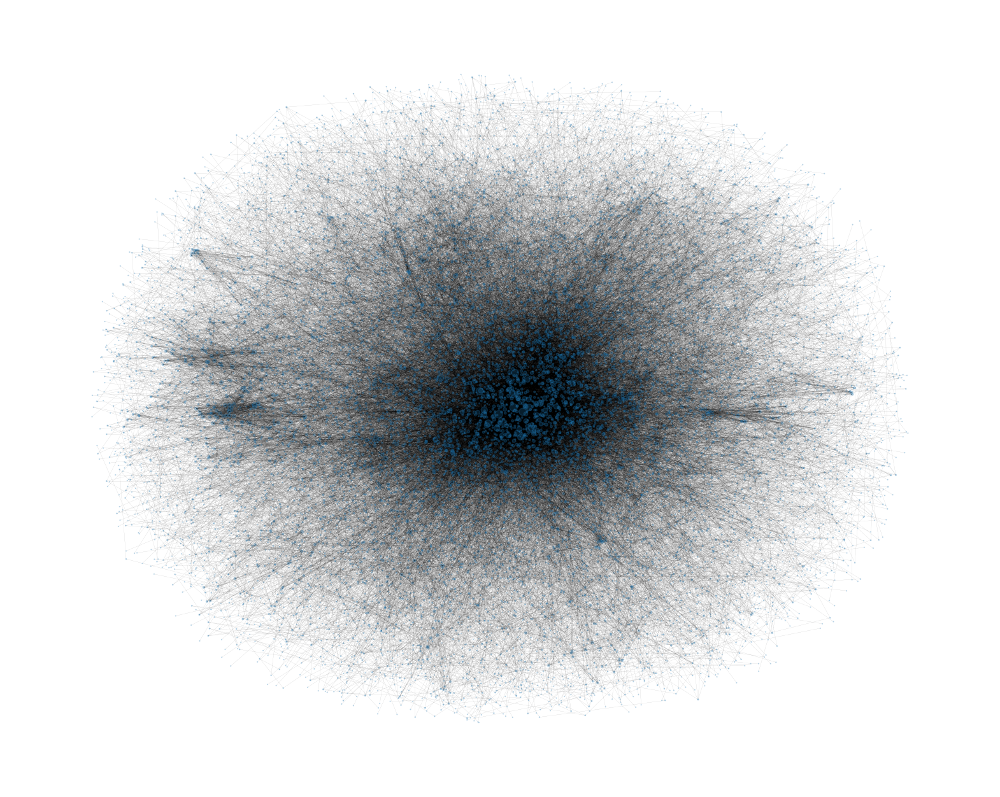

In [ ]:
#users with highest degree centralities from the size of their nodes:  I think this could be sharpened with a larger node size?
node_size = [v * 5000 for v in degree_centrality.values()]  # set up nodes size for a nice graph representation
plt.figure(figsize=(20, 16))
nx.draw_networkx(G, pos=pos, node_size=node_size, alpha=0.25, with_labels=False, width=0.15)
plt.axis("off")

In [ ]:
#These are nodes that connect other nodes
betweenness_centrality = nx.centrality.betweenness_centrality(G)  # save results in a variable to use again  These betweenness centralities are much more evenly distributed than the politicians.  
#The top 7 degree centralities are in the top 10 betweenness 
(sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True))[:10]

[(9886, 0.056948978296918334),
 (8223, 0.05112654480581488),
 (8396, 0.049575786205879),
 (856, 0.04489220208264501),
 (11380, 0.04210530193545508),
 (11934, 0.04190199990098203),
 (1237, 0.033271230793848416),
 (3221, 0.03034199737128666),
 (13635, 0.021140323058018756),
 (2897, 0.02072419659251588)]

(-1.2077238819003107,
 1.1860465666651727,
 -1.1915516394376755,
 1.1959571379423142)

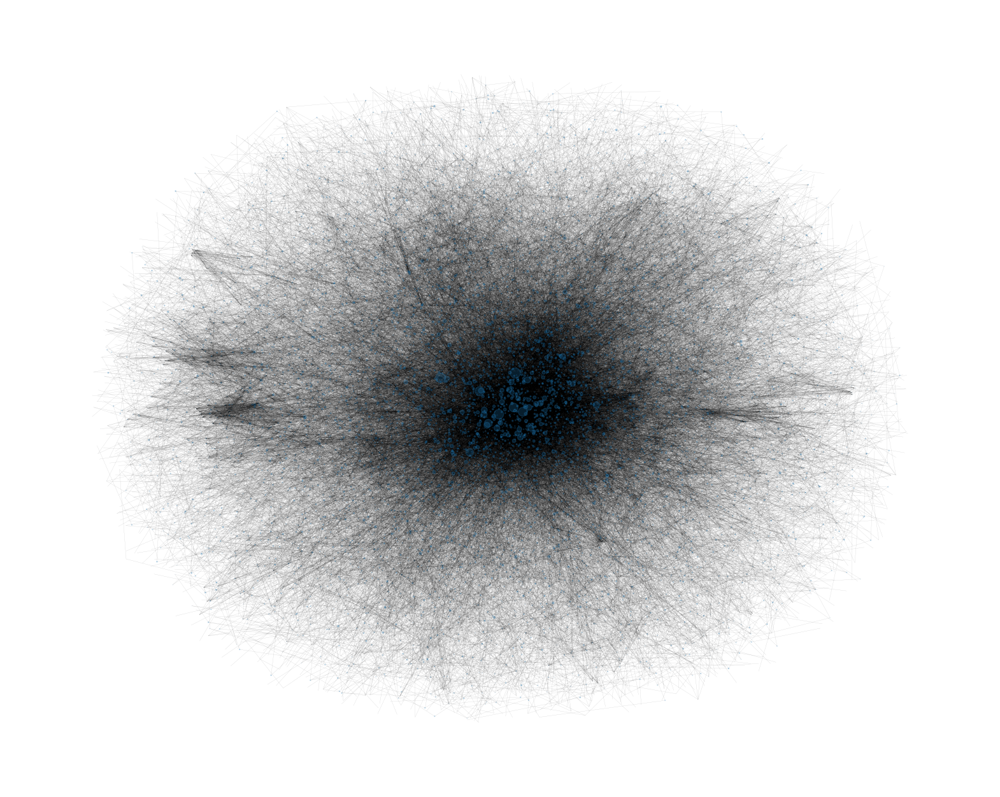

In [ ]:
#highest betweenness centralities and where they are located in the network.
node_size = [v * 2400 for v in betweenness_centrality.values()]  # set up nodes size for a nice graph representation
plt.figure(figsize=(20, 16))
nx.draw_networkx(G, pos=pos,alpha = 0.25, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

In [ ]:
#Finding the ten nodes with the highest closeness centrality
closeness_centrality = nx.centrality.closeness_centrality(G)  
# save results in a variable to use again
(sorted(closeness_centrality.items(), key=lambda item: item[1], reverse=True))[:10]

[(8396, 0.29136556964116117),
 (11380, 0.2866370117604046),
 (1237, 0.2833336679583191),
 (786, 0.282663995993991),
 (8223, 0.28075201432408237),
 (9886, 0.28055666003976143),
 (486, 0.2804841691014251),
 (636, 0.28032816193559923),
 (6658, 0.27985563003212627),
 (856, 0.27940681489694497)]

In [ ]:
#average distance of the node with the greatest closeness centrality to other nodes
#less than politicians
print(1/ closeness_centrality[8396])

3.432114512471655


Text(0, 0.5, 'Counts')

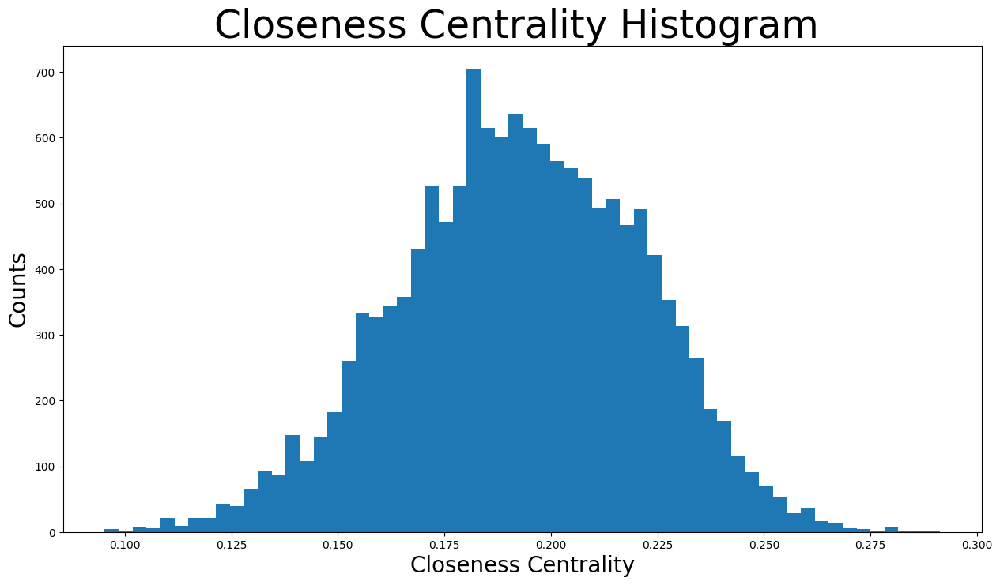

In [ ]:
#This histogram is a little less skewed to the right than the politicians
plt.figure(figsize=(15, 8))
plt.hist(closeness_centrality.values(), bins=60)
plt.title("Closeness Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Closeness Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

(-1.2077238819003107,
 1.1860465666651727,
 -1.1915516394376755,
 1.1959571379423142)

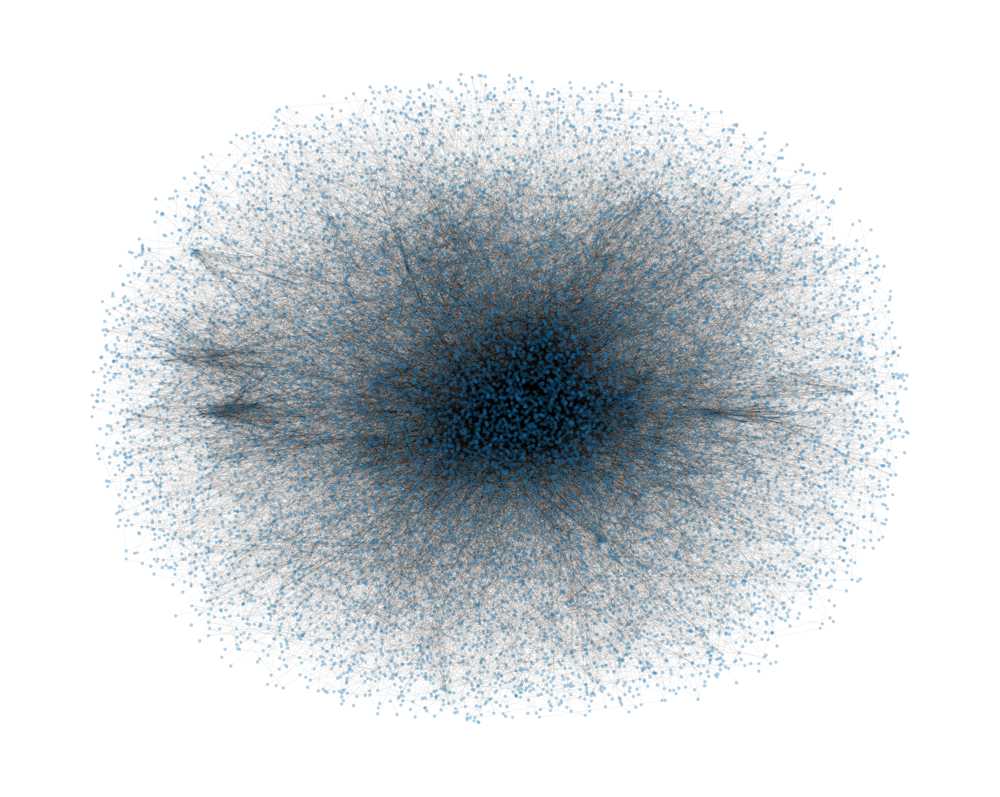

In [ ]:
#much more evenly distributed structure?  
#I think these closeness centralities are so similar that not very much info can be gleaned from this graph.
node_size = [v * 50 for v in closeness_centrality.values()]  
# set up nodes size for a nice graph representation
plt.figure(figsize=(20, 16))
nx.draw_networkx(G, pos=pos, node_size=node_size,alpha=0.25, with_labels=False, width=0.15)
plt.axis("off")

In [ ]:
#Eigenvector centrality identifies the nodes with the most influence in the network
eigenvector_centrality = nx.centrality.eigenvector_centrality(G)  
# save results in a variable to use again
(sorted(eigenvector_centrality.items(), key=lambda item: item[1], reverse=True))[:10]
#node 11380  is also a high centrality node

[(4596, 0.23186024902351227),
 (10503, 0.21448005849524632),
 (4535, 0.19986061870820412),
 (12970, 0.18277108049761343),
 (1229, 0.18275625707542048),
 (4741, 0.17373273233432707),
 (5471, 0.1645721880055891),
 (11390, 0.16344291617213955),
 (1030, 0.159701557046592),
 (6609, 0.15890058369043605)]

In [ ]:
high_eigenvector_centralities = (sorted(eigenvector_centrality.items(), key=lambda item: item[1], reverse=True))[1:10]  
# 2nd to 10th nodes with heighest eigenvector centralities
high_eigenvector_nodes = [tuple[0] for tuple in high_eigenvector_centralities]  
# set list as [highest eigenvector centralities
neighbors_4596 = [n for n in G.neighbors(4596)]  
# list with all nodes connected to 4596
all(item in neighbors_4596 for item in high_eigenvector_nodes)  # check if items in list high_eigenvector_nodes exist in list neighbors_5416
#these nodes are not connected to 4596

False

Text(0, 0.5, 'Counts')

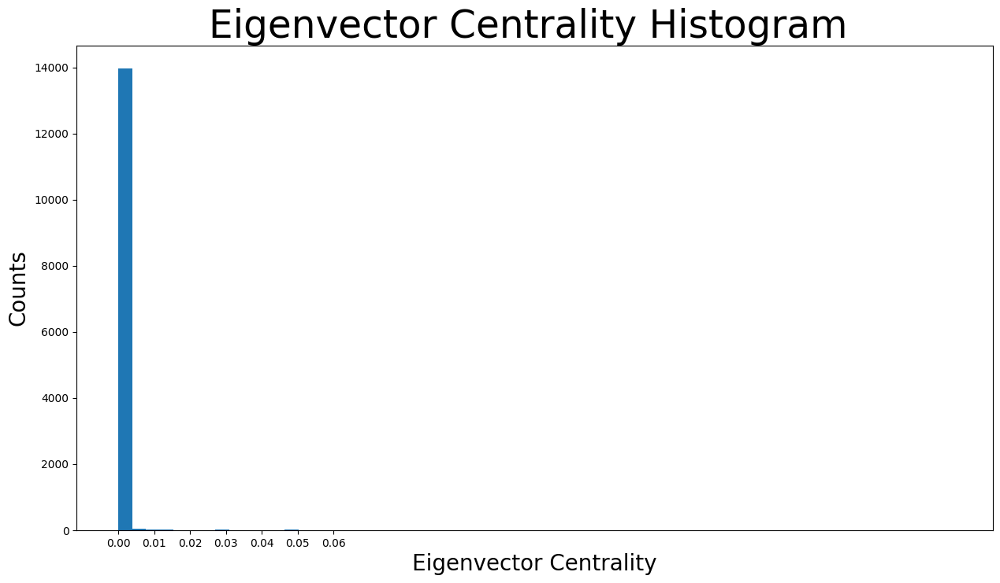

In [ ]:
plt.figure(figsize=(15, 8))
plt.hist(eigenvector_centrality.values(), bins=60)
plt.xticks(ticks=[0, 0.010, 0.020, 0.030,0.040,0.050, 0.060])  # set the x axis ticks
plt.title("Eigenvector Centrality Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Eigenvector Centrality", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})
#a few nodes have high centrality

(-1.1715200877189638,
 1.2010556197166444,
 -1.2057804149389266,
 1.1655938905477523)

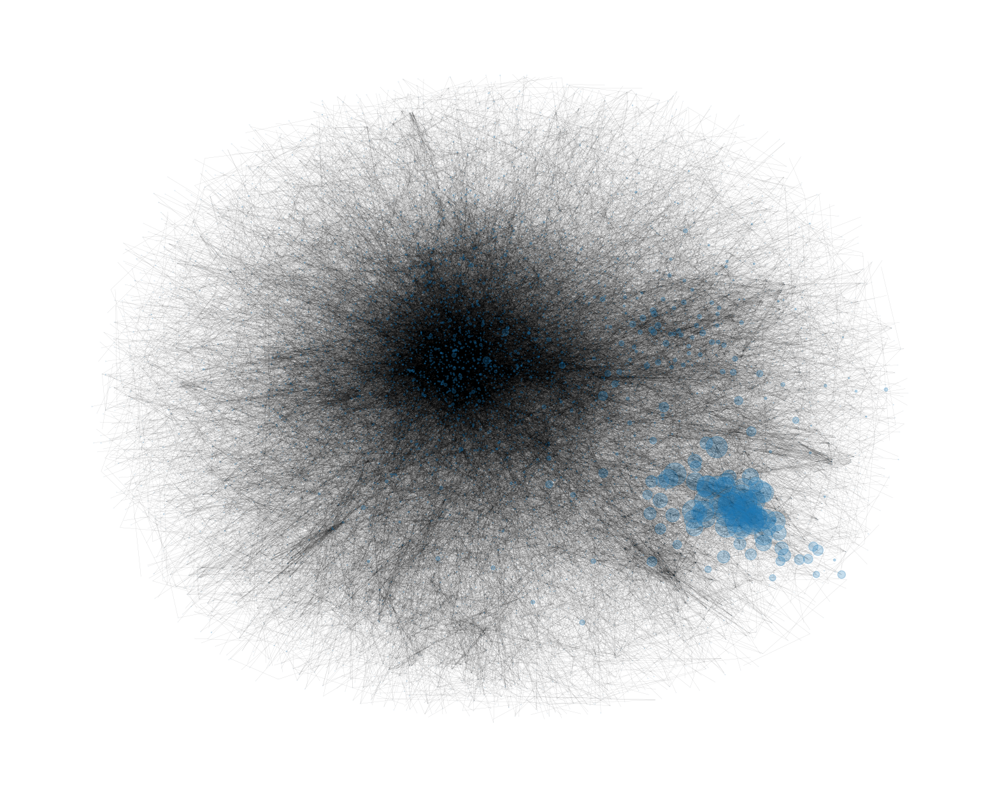

In [ ]:
node_size = [v * 4000 for v in eigenvector_centrality.values()]  # set up nodes size for a nice graph representation
plt.figure(figsize=(20, 16))
nx.draw_networkx(G, pos=pos, node_size=node_size,alpha = 0.25, with_labels=False, width=0.15)
plt.axis("off")
#more dense network than the one in the example


In [ ]:
#average clustering coefficient is the average of clustering coefficients of all the nodes.  Closer to one indicates one component.
#less clustered than politicians
nx.average_clustering(G)

0.2392418380399809

Text(0, 0.5, 'Counts')

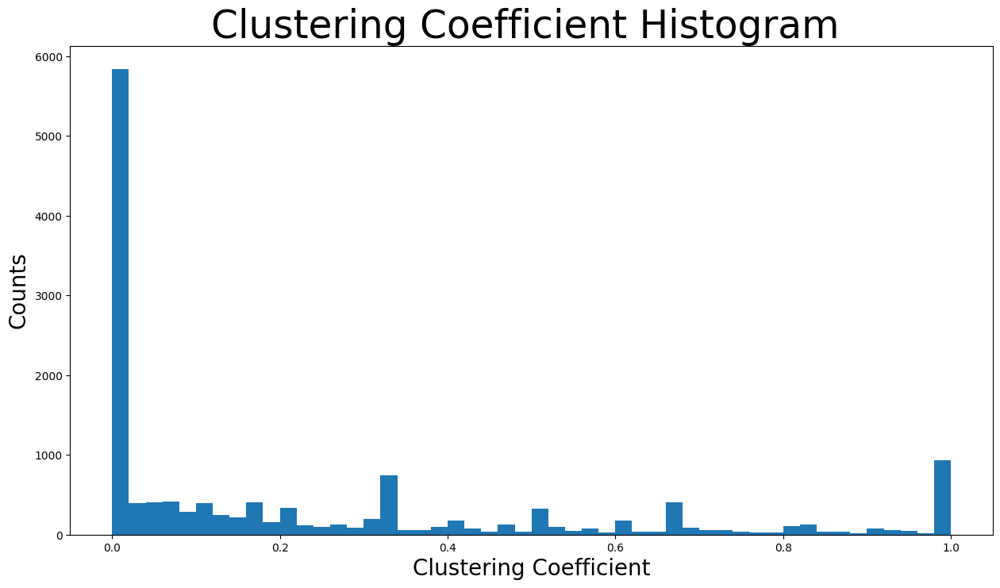

In [ ]:
#average clustering coefficient distribution
plt.figure(figsize=(15, 8))
plt.hist(nx.clustering(G).values(), bins=50)
plt.title("Clustering Coefficient Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Clustering Coefficient", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})
#like politicians, with a more uniform distribution of clustering coefficients

In [ ]:
#Find the number of unique triangles
triangles_per_node = list(nx.triangles(G).values())
sum(triangles_per_node) / 3  # divide by 3 because each triangle is counted once for each node
#fewer triangles, with more more nodes (14,113 vs 5908)

56005.0

In [ ]:
#average number of triangles that a node belongs to a lot less than politicians (88 vs 12)
np.mean(triangles_per_node)  #

11.9049812229859

In [ ]:
#majority of nodes of the network belong to extremely few triangles much fewer than politicians
np.median(triangles_per_node)

1.0

In [ ]:
#Exploring bridges that connect components
nx.has_bridges(G)


True

In [ ]:
#Find number of bridges more bridges than politicians.2722 vs 649
bridges = list(nx.bridges(G))
len(bridges)

2722

In [ ]:
#what are local bridges?  many more local bridges than politicians (18848 vs 3443)
local_bridges = list(nx.local_bridges(G, with_span=False))
len(local_bridges)

18848

In [ ]:
#Exploring assortivity - preference for a network’s nodes to attach to others that are similar in some way
#this is much lower than the example  still close to zero, indicating that nodes only slightly (companies = 0.013 vs politicians 0.018)
#attach to others that are similar
nx.degree_assortativity_coefficient(G)


0.012977786248196807

In [ ]:
import networkx.algorithms.community as nxcom

communities = sorted(nxcom.greedy_modularity_communities(G), key=len, reverse=True)
len(communities)

195